<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Import Needed Libraries</h2>
</div>

In [ ]:
import os
import cv2
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import tensorflow as tf 
import keras 
from sklearn.metrics import confusion_matrix , classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Reading Dataset And Get Info</h2>
</div>

In [2]:
IMAGE_SIZE = (224,224)

In [3]:
class_names = [name for name in os.listdir(r'D:\Ahmed\Study\Instant\Private Study Hard\Me\AI Projects\2- Deep Learning\Bird Species Prediction\Bird Speciees Dataset')]
class_names_dict = {name : i for i , name in enumerate(class_names)}
print(class_names_dict)

{'AMERICAN GOLDFINCH': 0, 'BARN OWL': 1, 'CARMINE BEE-EATER': 2, 'DOWNY WOODPECKER': 3, 'EMPEROR PENGUIN': 4, 'FLAMINGO': 5}


In [ ]:
def Load_Images():
    data = r'D:\Ahmed\Study\Instant\Private Study Hard\Me\AI Projects\2- Deep Learning\Bird Species Prediction\Bird Speciees Dataset'
    Images = []
    Labels = []
    
    for folder in os.listdir(data):
        for file in tqdm(os.listdir(os.path.join(data,folder))):
            image_path = os.path.join(os.path.join(data,folder),file)
            image = cv2.imread(image_path)
            image = cv2.resize(image , IMAGE_SIZE)
            image = cv2.cvtColor(image , cv2.COLOR_BGR2RGB)

            Images.append(image)
            Labels.append(class_names_dict[folder])
    
    Images = np.array(Images , dtype='float32')
    Labels = np.array(Labels , dtype='int32')
    

    return (Images,Labels)

Images , Labels  = Load_Images()


100%|██████████| 132/132 [00:00<00:00, 977.32it/s]


#### Shuffel Training Image

In [6]:
Images , Labels = tqdm(shuffle(Images , Labels , random_state = 25))

100%|██████████| 2/2 [00:00<?, ?it/s]


<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">EDA of Images and Get Insights</h2>
</div>

#### Number of Images

In [7]:
print(f"Number of Total Images {Images.shape[0]}")
print(f"Size of Images {(Images.shape[1],Images.shape[2])}")

Number of Total Images 811
Size of Images (224, 224)


In [8]:
_ , counts = np.unique(Labels,return_counts=True)
df = pd.DataFrame({'Counts':counts},index = class_names)
df

,Counts
AMERICAN GOLDFINCH,143
BARN OWL,129
CARMINE BEE-EATER,131
DOWNY WOODPECKER,137
EMPEROR PENGUIN,139
FLAMINGO,132


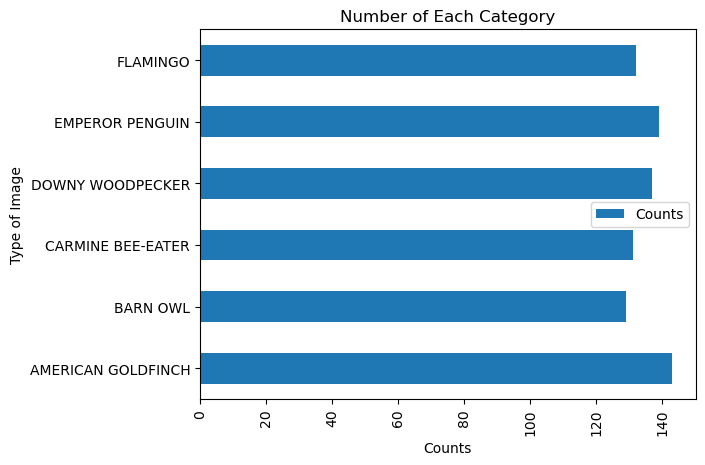

In [10]:
df.plot.barh()
plt.xticks(rotation = 90)
plt.title('Number of Each Category')
plt.xlabel('Counts')
plt.ylabel('Type of Image')
plt.show()

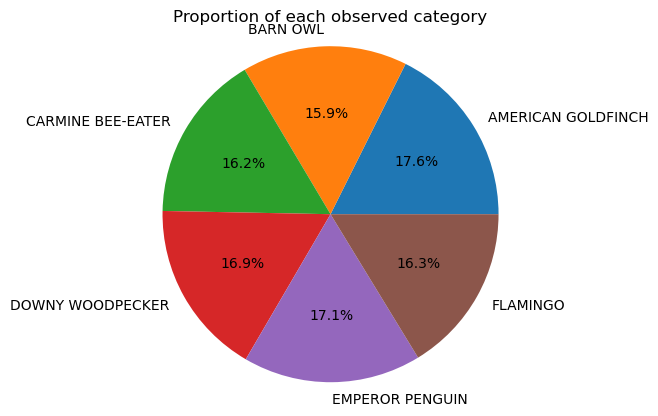

In [11]:
plt.pie(counts,
        explode=(0, 0, 0, 0, 0, 0) , 
        labels = class_names,
        autopct='%1.1f%%')
plt.axis('equal')
plt.title('Proportion of each observed category')
plt.show()

#### Images In Dataset

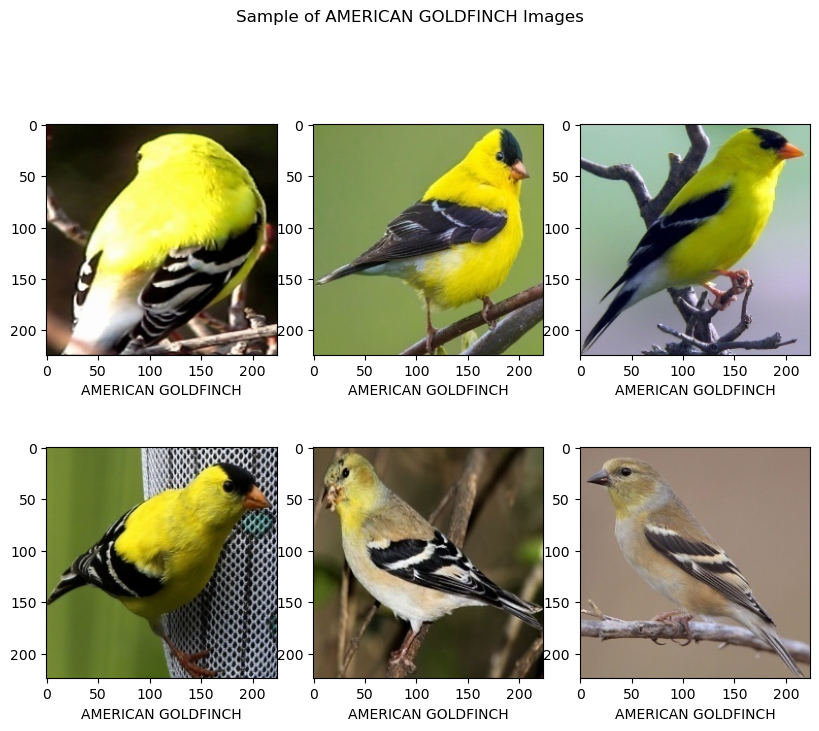

In [13]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[0]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 0)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx] / 255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

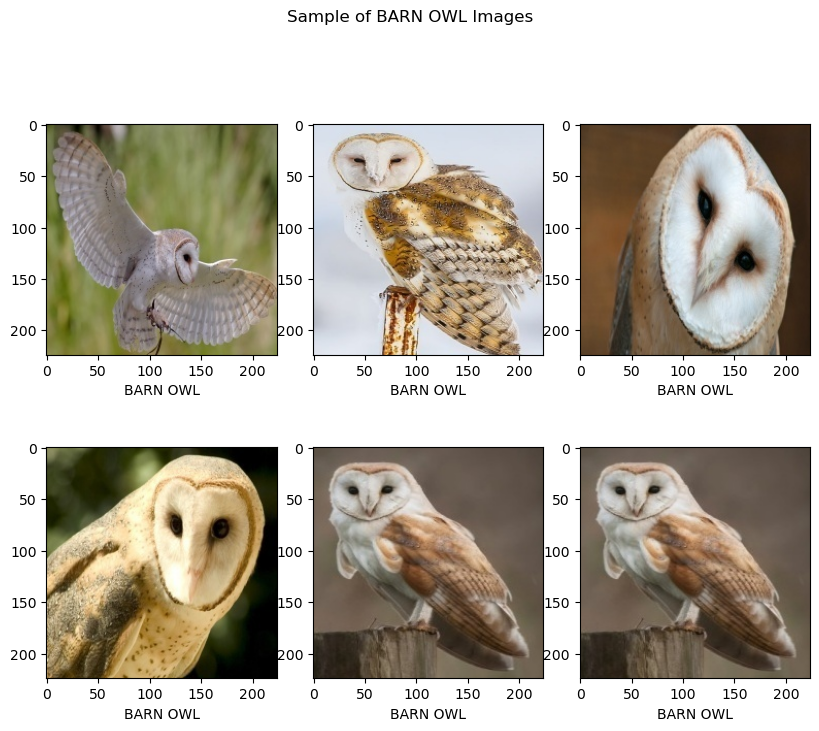

In [14]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[1]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 1)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx]/255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

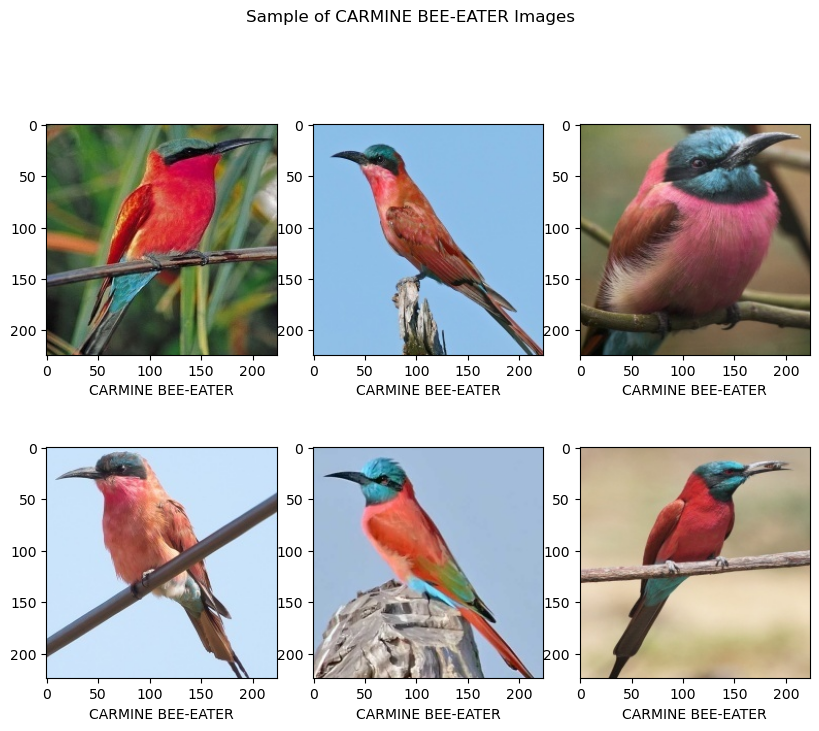

In [15]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[2]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 2)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx]/255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

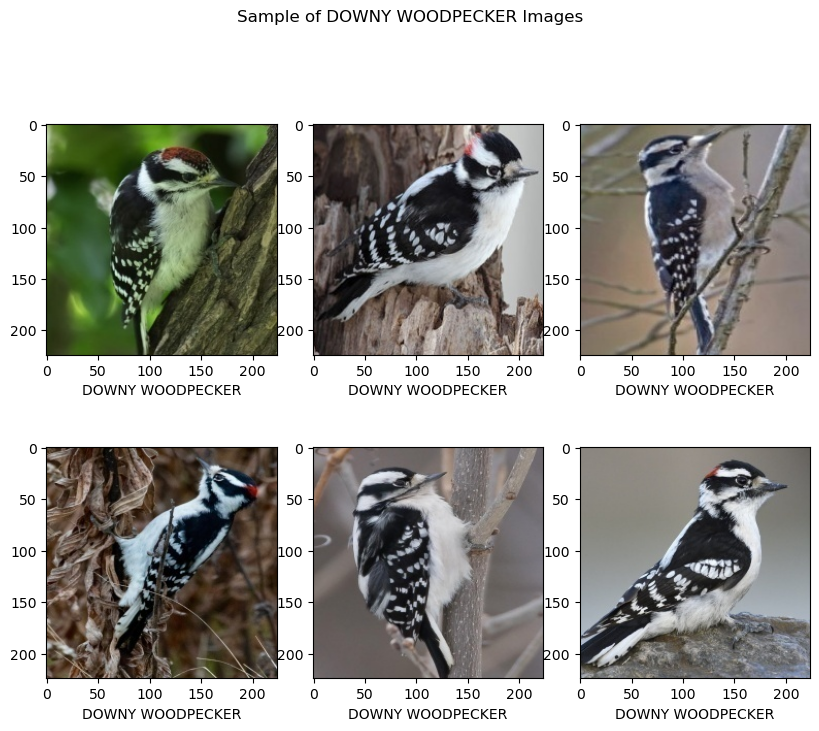

In [16]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[3]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 3)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx]/255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

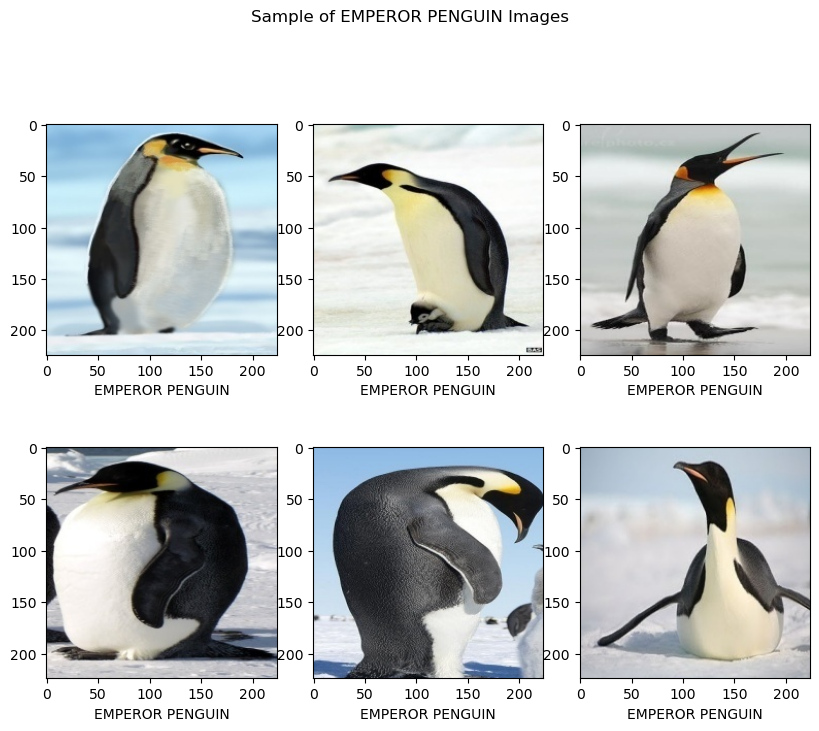

In [17]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[4]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 4)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx]/255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

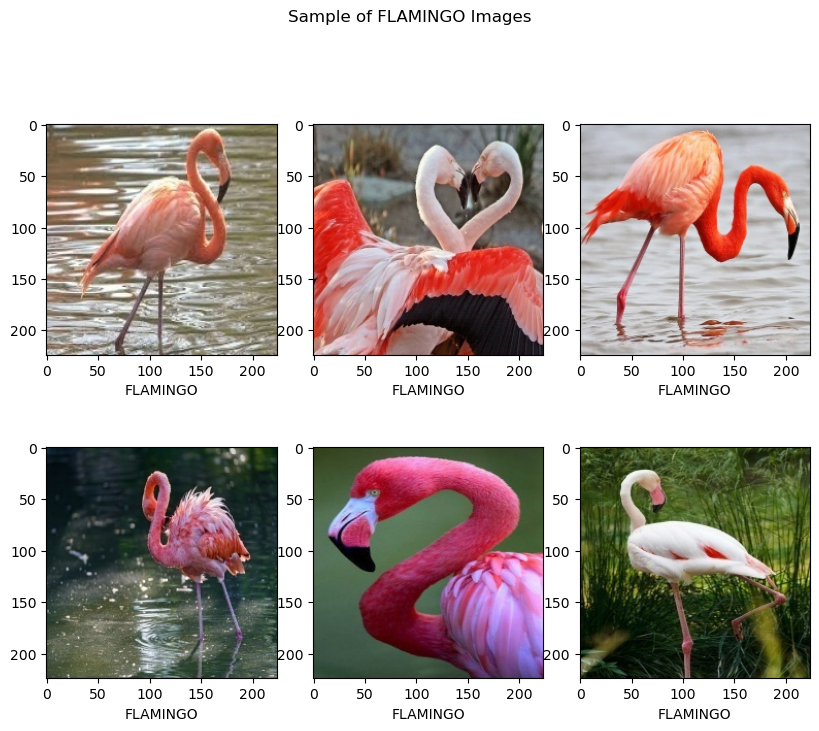

In [18]:
plt.figure(figsize=(8,8))
plt.suptitle(f'Sample of {class_names[5]} Images')

for i in range(6):
    plt.subplot(2,3,i+1)
    Category_List = np.where(Labels == 5)[0]
    idx = np.random.choice(Category_List)
    plt.imshow(Images[idx]/255.0)
    plt.xlabel(f'{class_names[Labels[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Modeling</h2>
</div>

In [ ]:
Train_Image , Test_Image , Train_Label , Test_Label = train_test_split(Images, Labels, test_size=0.2, random_state=42)

In [24]:
Train_Image , val_Image , Train_Label , val_Label = train_test_split(Train_Image, Train_Label, test_size=0.2, random_state=42)

In [31]:
print(f"Train Image Shape: {Train_Image.shape}")
print(f"Validation Image Shape: {val_Image.shape}")
print(f"Train Label Shape: {Train_Label.shape}")
print(f"Validation Label Shape: {val_Label.shape}")
print(f"Test Image Shape: {Test_Image.shape}")
print(f"Test Label Shape: {Test_Label.shape}")

Train Image Shape: (518, 224, 224, 3)
Validation Image Shape: (130, 224, 224, 3)
Train Label Shape: (518,)
Validation Label Shape: (130,)
Test Image Shape: (163, 224, 224, 3)
Test Label Shape: (163,)


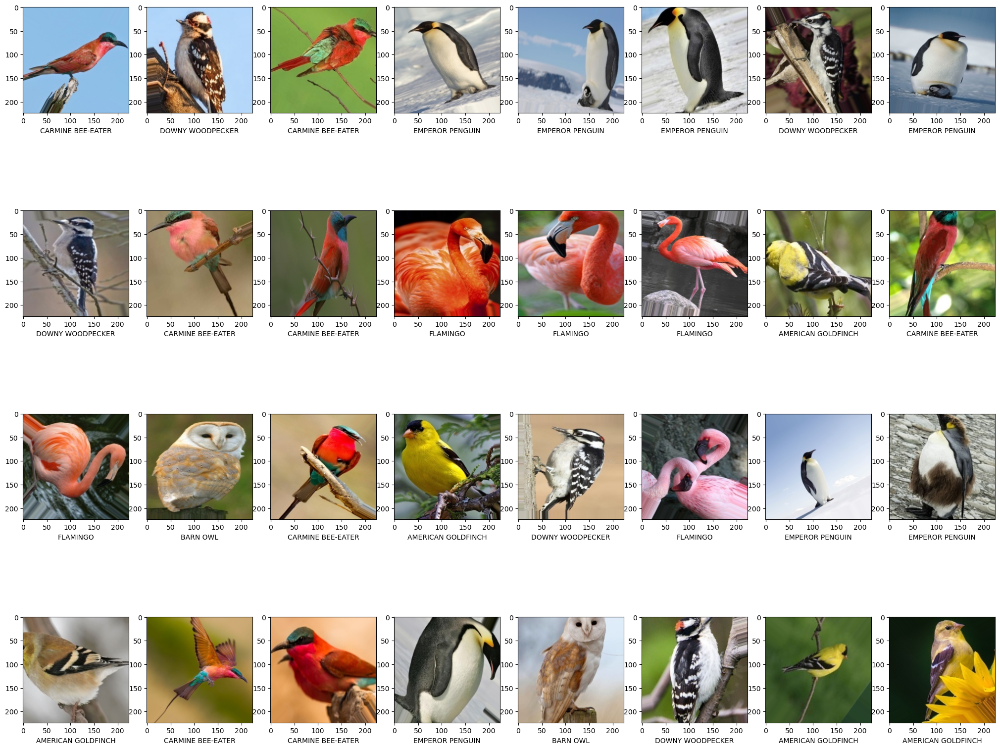

In [27]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range = 40,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow(x=Train_Image,
    y=Train_Label,
    batch_size=32,
    shuffle=True,   
)

val_generator = val_datagen.flow(x=val_Image,
    y=val_Label,
    batch_size=32,
    shuffle=True,
)

for x , y in train_generator:
    plt.figure(figsize=(20,20))
    for i in range(32):
        plt.subplot(4,8,i+1)
        plt.imshow(x[i])
        plt.xlabel(f'{class_names[y[i]]}')
        plt.tight_layout(pad=0 , h_pad=0 , w_pad=0)
    break

In [28]:
KerasModel = keras.models.Sequential([
    keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same', input_shape=(IMAGE_SIZE[0], IMAGE_SIZE[1], 3)),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Flatten(),
    keras.layers.Dense(512, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(6, activation='softmax')
])


In [29]:
KerasModel.compile(optimizer=Adam(learning_rate=0.001),
                   loss='sparse_categorical_crossentropy',
                   metrics=['accuracy'])

In [30]:
history = KerasModel.fit(
    train_generator,
    epochs=50,
    validation_data=val_generator,
    callbacks=[keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)]
)

Epoch 1/50


17/17 [==============================] - 20s 1s/step - loss: 1.7676 - accuracy: 0.3340 - val_loss: 1.1646 - val_accuracy: 0.5308
Epoch 2/50
17/17 [==============================] - 17s 1s/step - loss: 1.0794 - accuracy: 0.5907 - val_loss: 0.9093 - val_accuracy: 0.7154
Epoch 3/50
17/17 [==============================] - 17s 1s/step - loss: 0.7452 - accuracy: 0.7201 - val_loss: 0.4785 - val_accuracy: 0.8538
Epoch 4/50
17/17 [==============================] - 18s 1s/step - loss: 0.5838 - accuracy: 0.7896 - val_loss: 0.4736 - val_accuracy: 0.8385
Epoch 5/50
17/17 [==============================] - 17s 1s/step - loss: 0.5303 - accuracy: 0.7973 - val_loss: 0.4457 - val_accuracy: 0.8385
Epoch 6/50
17/17 [==============================] - 18s 1s/step - loss: 0.4717 - accuracy: 0.8108 - val_loss: 0.3817 - val_accuracy: 0.8538
Epoch 7/50
17/17 [==============================] - 18s 1s/step - loss: 0.3582 - accuracy: 0.8687 - val_loss: 0.3986 - val_accuracy: 0.8385
Epoch 8/50
17/17 [

#### Summary of KerasModel

In [32]:
print(KerasModel.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 128)     3584      
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 128)     0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      73792     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 32)        18464     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 32)        0

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Evaluating</h2>
</div>

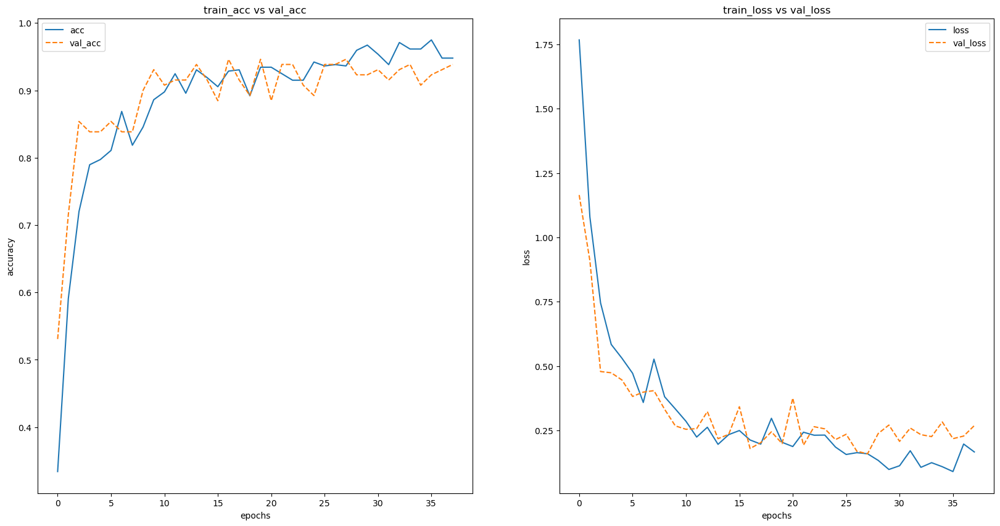

In [33]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(20,10))

    # Plot accuracy
    plt.subplot(121)
    plt.plot(history.history['accuracy'],'-', label = "acc")
    plt.plot(history.history['val_accuracy'], '--', label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(122)
    plt.plot(history.history['loss'],'-', label = "loss")
    plt.plot(history.history['val_loss'], '--', label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()
plot_accuracy_loss(history)    

In [34]:
predictions = KerasModel.predict(Test_Image)     # Vector of probabilities
pred_labels = np.argmax(predictions, axis = 1) # We take the highest probability

6/6 [==============================] - 2s 235ms/step


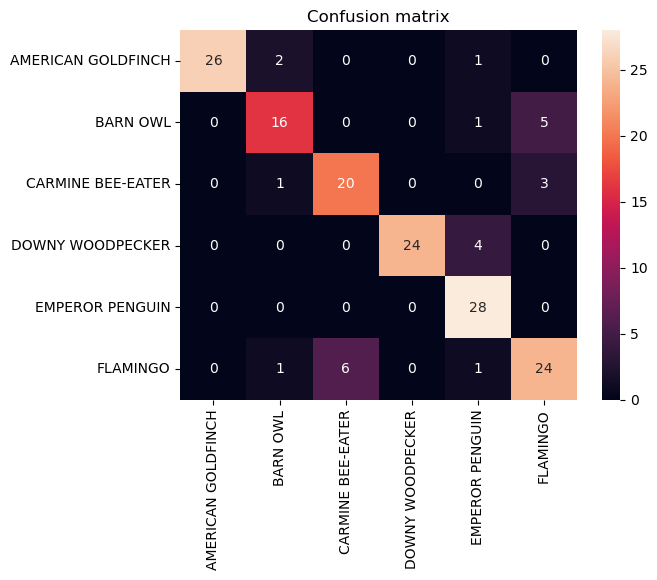

In [43]:
CM = confusion_matrix(Test_Label, pred_labels)
ax = plt.axes()
sns.heatmap(CM, annot=True, 
           annot_kws={"size": 10}, 
           xticklabels = class_names, 
           yticklabels = class_names,
           ax = ax,           
           fmt='d')
ax.set_title('Confusion matrix')
plt.show()

In [44]:
print(classification_report(Test_Label, pred_labels,target_names = class_names))

                    precision    recall  f1-score   support

AMERICAN GOLDFINCH       1.00      0.90      0.95        29
          BARN OWL       0.80      0.73      0.76        22
 CARMINE BEE-EATER       0.77      0.83      0.80        24
  DOWNY WOODPECKER       1.00      0.86      0.92        28
   EMPEROR PENGUIN       0.80      1.00      0.89        28
          FLAMINGO       0.75      0.75      0.75        32

          accuracy                           0.85       163
         macro avg       0.85      0.84      0.84       163
      weighted avg       0.86      0.85      0.85       163



<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Predicting</h2>
</div>

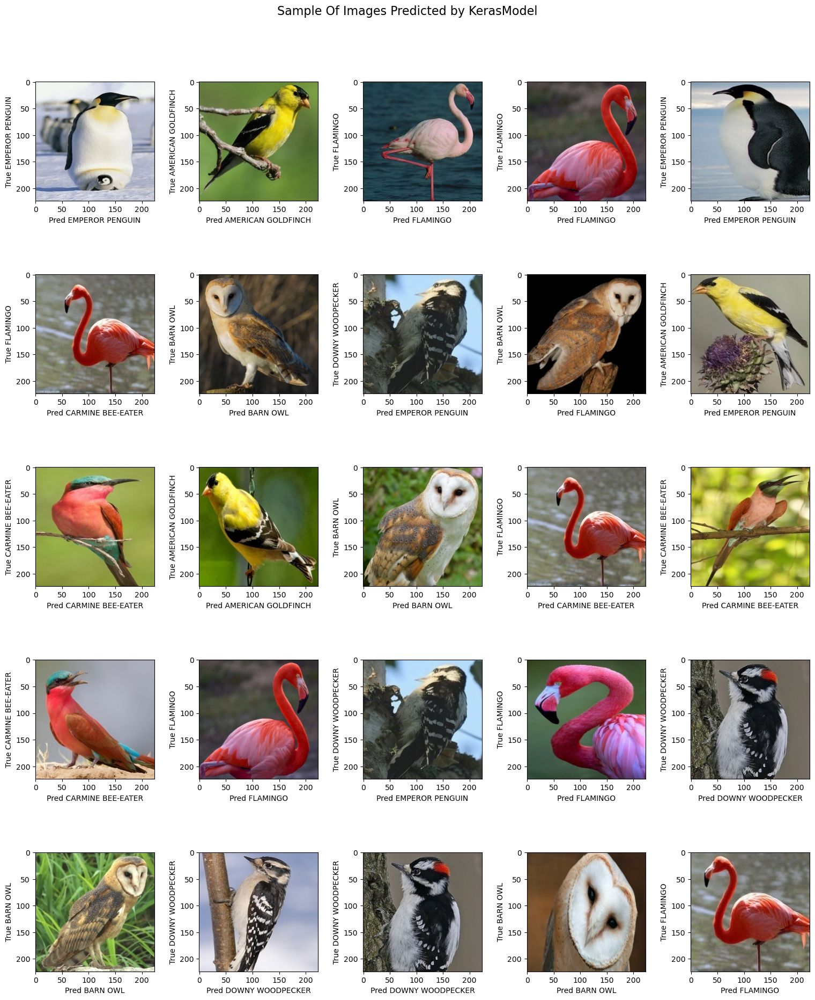

In [57]:
plt.figure(figsize=(15,20))
plt.suptitle(f"Sample Of Images Predicted by KerasModel" , fontsize=16)

for i in range(25):
    plt.subplot(5,5,i+1)
    idx = np.random.choice(np.arange(len(pred_labels)))
    plt.imshow(Test_Image[idx] / 255.0)
    plt.xlabel(f'Pred {class_names[pred_labels[idx]]}')
    plt.ylabel(f'True {class_names[Test_Label[idx]]}')
    plt.tight_layout(pad=0 , h_pad=0 , w_pad=2)

<div style="background-color:black;
            color:white;
            transform:skew(-20deg);
            padding:30px;
            font-family:Verdana;
            letter-spacing:1px;
            margin:auto;
            width:fit-content;">
    <h2 style="transform:skew(20deg); margin:0;">Save The Keras Model</h2>
</div>

#### Save Model

In [36]:
KerasModel.save('Model_Bird_ACC85.h5')